## import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sbn
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, ElasticNet, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import AdaBoostRegressor, BaggingRegressor, ExtraTreesRegressor, GradientBoostingRegressor, RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping

In [2]:
train = pd.read_csv('train.csv', index_col = None)
test = pd.read_csv('test.csv')

## EDA

In [3]:
train.head()

,id,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,0,I,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,9
1,1,I,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,8
2,2,M,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,9
3,3,F,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,11
4,4,I,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,8


In [4]:
train.sample()

,id,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
30504,30504,F,1.6,1.25,0.475,38.427747,17.222321,8.660772,11.056305,11


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74051 entries, 0 to 74050
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              74051 non-null  int64  
 1   Sex             74051 non-null  object 
 2   Length          74051 non-null  float64
 3   Diameter        74051 non-null  float64
 4   Height          74051 non-null  float64
 5   Weight          74051 non-null  float64
 6   Shucked Weight  74051 non-null  float64
 7   Viscera Weight  74051 non-null  float64
 8   Shell Weight    74051 non-null  float64
 9   Age             74051 non-null  int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 5.6+ MB


In [6]:
train.isna().sum()

id                0
Sex               0
Length            0
Diameter          0
Height            0
Weight            0
Shucked Weight    0
Viscera Weight    0
Shell Weight      0
Age               0
dtype: int64

In [7]:
train.describe()

,id,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
count,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000,74051.000000
mean,37025.000000,1.317460,1.024496,0.348089,23.385217,10.104270,5.058386,6.723870,9.967806
std,21376.826729,0.287757,0.237396,0.092034,12.648153,5.618025,2.792729,3.584372,3.175189
min,0.000000,0.187500,0.137500,0.000000,0.056699,0.028349,0.042524,0.042524,1.000000
25%,18512.500000,1.150000,0.887500,0.300000,13.437663,5.712424,2.863300,3.968930,8.000000
50%,37025.000000,1.375000,1.075000,0.362500,23.799405,9.908150,4.989512,6.931453,10.000000
75%,55537.500000,1.537500,1.200000,0.412500,32.162508,14.033003,6.988152,9.071840,11.000000
max,74050.000000,2.012815,1.612500,2.825000,80.101512,42.184056,21.545620,28.491248,29.000000


In [8]:
train.describe(include = object)

,Sex
count,74051
unique,3
top,M
freq,27084


## plotting

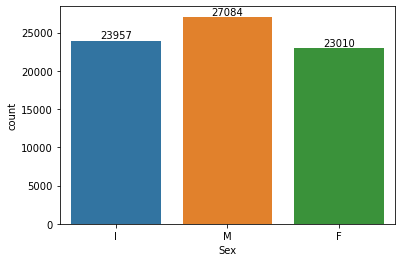

In [9]:
ax = sbn.countplot(x = train.Sex)
ax.bar_label(ax.containers[0]);

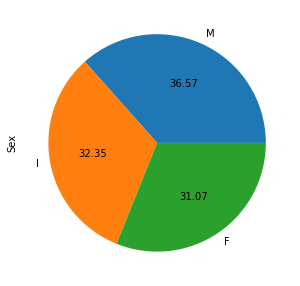

In [10]:
plt.figure(figsize = (5, 5))
train["Sex"].value_counts().plot(kind = "pie" , autopct = "%.2f" );

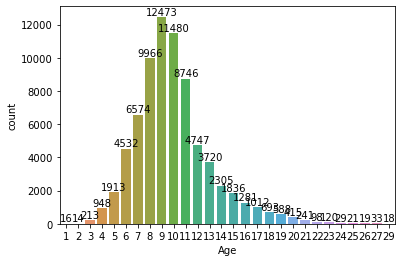

In [11]:
bx = sbn.countplot(x = train.Age)
bx.bar_label(bx.containers[0]);

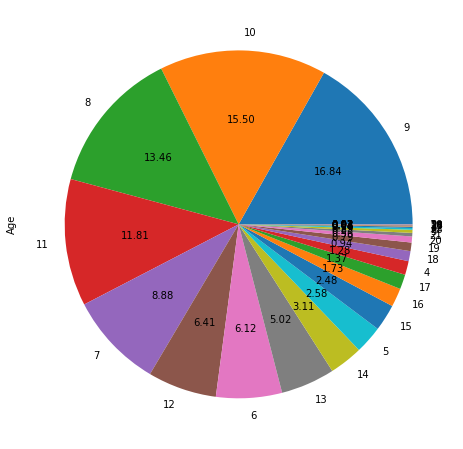

In [12]:
plt.figure(figsize = (8, 8))
train["Age"].value_counts().plot(kind = "pie" , autopct = "%.2f" );

In [13]:
train.Age.value_counts()

9     12473
10    11480
8      9966
11     8746
7      6574
12     4747
6      4532
13     3720
14     2305
5      1913
15     1836
16     1281
17     1012
4       948
18      693
19      588
20      415
21      241
3       213
23      120
22       98
27       33
24       29
25       21
26       19
29       18
1        16
2        14
Name: Age, dtype: int64

In [14]:
train.Age.nunique()

28

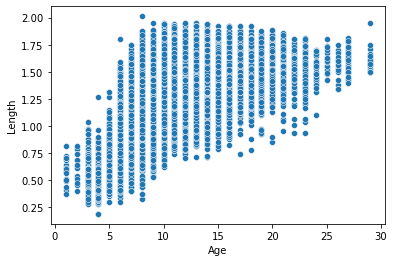

In [15]:
sbn.scatterplot(x = train['Age'], y = train['Length']);

In [ ]:
fig = px.scatter(data_frame = train, x = 'Age', y = 'Length', color = 'Age');
fig.show()

In [17]:
fig = px.scatter(train, x = "Age", y = "Length", color="Age", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

In [ ]:
fig = px.pie(train, values='Length', names='Age', title='Yaşa göre uzunluklar')
fig.show()

## corelasyon

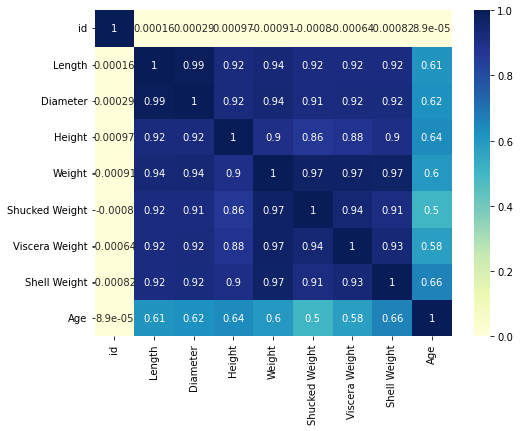

In [19]:
plt.figure(figsize = (8, 6))
sbn.heatmap(train.corr(), annot = True, cmap="YlGnBu");

In [20]:
train.corr()['Age'].sort_values(ascending = False)

Age               1.000000
Shell Weight      0.663473
Height            0.638067
Diameter          0.621256
Length            0.612843
Weight            0.601195
Viscera Weight    0.576808
Shucked Weight    0.503320
id                0.000089
Name: Age, dtype: float64

In [21]:
df1 = train.drop('id', axis = 1)

In [22]:
x = df1.drop('Age', axis = 1)
y = df1['Age']

In [23]:
x = pd.get_dummies(x, drop_first = True)
x

,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Sex_I,Sex_M
0,1.5250,1.1750,0.3750,28.973189,12.728926,6.647958,8.348928,1,0
1,1.1000,0.8250,0.2750,10.418441,4.521745,2.324659,3.401940,1,0
2,1.3875,1.1125,0.3750,24.777463,11.339800,5.556502,6.662133,0,1
3,1.7000,1.4125,0.5000,50.660556,20.354941,10.991839,14.996885,0,0
4,1.2500,1.0125,0.3375,23.289114,11.977664,4.507570,5.953395,1,0
...,...,...,...,...,...,...,...,...,...
74046,1.6625,1.2625,0.4375,50.660556,20.680960,10.361742,12.332033,0,0
74047,1.0750,0.8625,0.2750,10.446791,4.323299,2.296310,3.543687,1,0
74048,1.4875,1.2000,0.4125,29.483480,12.303683,7.540967,8.079607,0,0
74049,1.2125,0.9625,0.3125,16.768729,8.972617,2.919999,4.280774,1,0


In [24]:
#regression(x, y)

In [25]:
def regression2(x, y):
    model1 = LinearRegression()
    model2 = ElasticNet()
    model3 = Lasso()
    model4 = Ridge()
    #model5 = DecisionTreeRegressor()
    #model6 = ExtraTreeRegressor()
    model7 = AdaBoostRegressor()
    model8 = BaggingRegressor()
    model9 = ExtraTreesRegressor()
    model10 = GradientBoostingRegressor()
    model11 = RandomForestRegressor()
    model12 = SVR()
    
    models = [model1, model2, model3, model4, model12]
    model_names = ['LinearRegression', 'ElasticNet', 'Lasso', 'Ridge', 'Support']
    x_train, x_test, y_train, y_true = train_test_split(x, y, train_size = 0.8, random_state = 42)
    x_train = StandardScaler().fit_transform(x_train)
    x_test = StandardScaler().fit_transform(x_test)
    #x_train = MinMaxScaler().fit_transform(x_train)
    #x_test = MinMaxScaler().fit_transform(x_test)
    r2 = [] 
   
    score = pd.DataFrame(columns = ['R2_Score'], index = model_names)
    
    for model in models:
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        r2.append(r2_score(y_true, y_pred) * 100)
       
        
    score['R2_Score'] = r2
    
    return score.sort_values('R2_Score', ascending = False)

In [26]:
regression2(x, y)

,R2_Score
Support,56.887885
Ridge,55.697794
LinearRegression,55.697456
ElasticNet,39.414163
Lasso,34.287934


In [27]:
x_train, x_test, y_train, y_true = train_test_split(x, y, train_size = 0.8, random_state = 42)
gb = GradientBoostingRegressor()
gb.fit(x_train, y_train)
tahmin = gb.predict(x_test)
r2_score(y_true, tahmin) * 100

58.25236835140034

In [28]:
from xgboost import XGBRegressor
xg = XGBRegressor()
xg.fit(x_train, y_train)
tahmin = xg.predict(x_test)
r2_score(y_true, tahmin) * 100

58.19618657103851

## save predictions

In [29]:
test_id = test['id']
test = test.drop('id', axis = 1)
test = pd.get_dummies(test, drop_first = True)

In [30]:
def ml_save(model, csv_name):
    model.fit(x, y)
    tahmin = model.predict(test)
    sonuc = pd.DataFrame()
    sonuc['id'] = test_id
    sonuc['Age'] = tahmin
    sonuc.to_csv(csv_name, index = False)

In [31]:
# ml_save(GradientBoostingRegressor(), "gb_tahmin.csv")

In [32]:
# ml_save(XGBRegressor(), "xg_tahmin.csv")

In [33]:
# ml_save(SVR(), "Support_tahmin.csv")

## Deep learning 

In [34]:
x_train, x_test, y_train, y_true = train_test_split(x, y, train_size = 0.8, random_state = 42)

In [35]:
model = Sequential()

model.add(Dense(units = 100, activation = 'relu'))
model.add(Dense(units = 200, activation = 'relu'))
model.add(Dense(units = 200, activation = 'relu'))
model.add(Dense(units = 100, activation = 'relu'))
model.add(Dense(units = 100, activation = 'relu'))
model.add(Dense(units = 100, activation = 'relu'))
model.add(Dense(units = 50, activation = 'relu'))
model.add(Dense(units = 10, activation = 'relu'))
model.add(Dense(1, activation = 'relu'))

model.compile(loss = 'mse', optimizer = 'Adam')

In [36]:
early = EarlyStopping(monitor = 'loss', patience = 10, mode = 'min')

In [37]:
history = model.fit(x = x_train, y = y_train, validation_data = (x_test, y_true), batch_size = 128, epochs = 100, verbose = 1, callbacks = [early])

Epoch 1/100
463/463 [==============================] - 2s 2ms/step - loss: 6.8139 - val_loss: 4.5428
Epoch 2/100
463/463 [==============================] - 1s 2ms/step - loss: 4.5936 - val_loss: 5.2567
Epoch 3/100
463/463 [==============================] - 1s 2ms/step - loss: 4.5988 - val_loss: 4.5215
Epoch 4/100
463/463 [==============================] - 1s 2ms/step - loss: 4.5363 - val_loss: 4.3827
Epoch 5/100
463/463 [==============================] - 1s 2ms/step - loss: 4.5390 - val_loss: 4.3838
Epoch 6/100
463/463 [==============================] - 1s 2ms/step - loss: 4.4838 - val_loss: 5.6337
Epoch 7/100
463/463 [==============================] - 1s 2ms/step - loss: 4.4848 - val_loss: 4.4703
Epoch 8/100
463/463 [==============================] - 1s 2ms/step - loss: 4.4427 - val_loss: 4.3695
Epoch 9/100
463/463 [==============================] - 1s 2ms/step - loss: 4.4575 - val_loss: 4.2999
Epoch 10/100
463/463 [==============================] - 1s 2ms/step - loss: 4.4484 - val_lo

In [38]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 100)               1000      
                                                                 
 dense_1 (Dense)             (None, 200)               20200     
                                                                 
 dense_2 (Dense)             (None, 200)               40200     
                                                                 
 dense_3 (Dense)             (None, 100)               20100     
                                                                 
 dense_4 (Dense)             (None, 100)               10100     
                                                                 
 dense_5 (Dense)             (None, 100)               10100     
                                                                 
 dense_6 (Dense)             (None, 50)                5

In [39]:
loss = pd.DataFrame(history.history)
loss

,loss,val_loss
0,6.813859,4.542794
1,4.593595,5.256732
2,4.598841,4.521491
3,4.536332,4.382707
4,4.538984,4.383823
...,...,...
60,4.244300,4.260183
61,4.246059,4.207896
62,4.243419,4.251603
63,4.251632,4.213665


<AxesSubplot:>

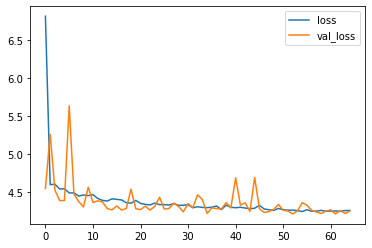

In [40]:
loss.plot()

In [41]:
tahmin = model.predict(x_test)
r2_score(y_true, tahmin) * 100

463/463 [==============================] - 1s 1ms/step


58.35484347510288

In [42]:
ml_save(model, 'DL_tahmin.csv')

1543/1543 [==============================] - 2s 1ms/step


<img src="2..png" alt="tahminler">